In [1]:
from boututils.datafile import DataFile
from boutdata.collect import collect
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os, sys, pathlib
import platform
import traceback
import xarray as xr
import xbout
from pathlib import Path
import xhermes as xh

sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/sdtools"))
sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/transients"))
sys.path.append(os.path.join(r"/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/general_functions"))

from heatflux_functions import * 

from plotting_functions import *
from convergence_functions import * 

from hermes3.case_db import *
from hermes3.casedeck import*
from hermes3.load import *
from hermes3.named_selections import *
from hermes3.plotting import *
from hermes3.grid_fields import *
from hermes3.accessors import *
from hermes3.utils import *
from hermes3.fluxes import *
from hermes3.selectors import *

# plt.style.use('ggplot')
plt.rcParams.update({'font.size': 10})
linewidth = 3
markersize = 15



# plt.style.use('ggplot')
plt.style.use('default')
plt.rcParams["axes.edgecolor"] = "black"
plt.rcParams["axes.linewidth"] = 1
plt.rcParams['xtick.labelsize'] = 18
plt.rcParams['ytick.labelsize'] = 18
plt.rcParams['axes.grid'] = True
plt.rcParams.update({'font.size': 16})



%load_ext autoreload
%autoreload 2


In [2]:


def replace_guards(var):
    """
	This in-place replaces the points in the guard cells with the points on the boundary
    
    """
    # Strip the edge guard cells
    var = var[1:-1]

    var[0] = 0.5*(var[0] + var[1])
    var[-1] = 0.5*(var[-1] + var[-2])
    return var

In [3]:
import scipy.integrate

def divq_integrate(dataframe, snb_int = False):
    """
    Calculate the total heat flux from the divergence of the Spitzer-Harm fluxes.
    If snb == True outputs integral of divq_snb, otherwise outputs integral of divq_sh.
    """

    x = np.ravel(dataframe['y'].values)[1:-1]
    Te = np.ravel(dataframe['Te'].values)


    div_q_snb = replace_guards(np.ravel(dataframe['Div_Q_SNB'].values))
    div_q_sh = replace_guards(np.ravel(dataframe['Div_Q_SH'].values))

    print('x =' , len(x))
    print('div_q_snb = ' , len(div_q_snb))

    q_snb = scipy.integrate.cumulative_trapezoid(div_q_snb, x, initial=0)
    q_sh = scipy.integrate.cumulative_trapezoid(div_q_sh, x, initial=0)

    if snb_int == False:
        return q_sh
    else:
        return q_snb

In [4]:
def spitzer_q(dataframe):
    
    x = dataframe['y']
    Te = dataframe['Te']
    Ti = dataframe['Td+']
    Ne = dataframe['Ne']
    Ni = dataframe['Nd+']
    kappa_e = dataframe['kappa_par_e']
    kappa_i = dataframe['kappa_par_d+']

    # print(kappa_e)

    grad_T = np.gradient(Te, x)
    q = -kappa_e * grad_T

    return q

# I/O

In [6]:

alpha_vals = [-1, 0.2, 0.06, 'snb']
neon_vals = [0.032,0.034,0.036,0.038]
parent_dir = '/users/jlb647/scratch/simulation_program/hermes-3_sim/simulation_dir/updated_flux_limitation/2025-04_selective_revisions/2024-03-25_wigram_reference_glover_comparison_FINAL_restart_selective_collisions/Long_runs/3-4_scan'


cs = dict()


for alpha in alpha_vals:
    for neon in neon_vals:
        name = f"alpha_{alpha}_neon_{neon}"
        print(f"Loading {name}")
        cs[name] = Load.case_1D(f'{parent_dir}/alpha_{alpha}/neon_{neon}', guard_replace = False, use_squash=True)


Loading alpha_-1_neon_0.032
- Looking for squash file
- Squash file found. squash date 04/24/2025, 15:31:11, dmp file date 04/23/2025, 23:05:30
Skipping unnormalisation
Loading alpha_-1_neon_0.034
- Looking for squash file
- Squash file found. squash date 04/24/2025, 15:31:33, dmp file date 04/23/2025, 20:24:41
Skipping unnormalisation
Loading alpha_-1_neon_0.036
- Looking for squash file
- Squash file found. squash date 04/24/2025, 15:31:55, dmp file date 04/24/2025, 06:17:47
Skipping unnormalisation
Loading alpha_-1_neon_0.038
- Looking for squash file
- Squash file found. squash date 04/24/2025, 15:32:17, dmp file date 04/23/2025, 20:22:14
Skipping unnormalisation
Loading alpha_0.2_neon_0.032
- Looking for squash file
- Squashoutput file not found, creating...
- Done
Skipping unnormalisation
Loading alpha_0.2_neon_0.034
- Looking for squash file
- Squashoutput file not found, creating...
- Done
Skipping unnormalisation
Loading alpha_0.2_neon_0.036
- Looking for squash file
- Squasho

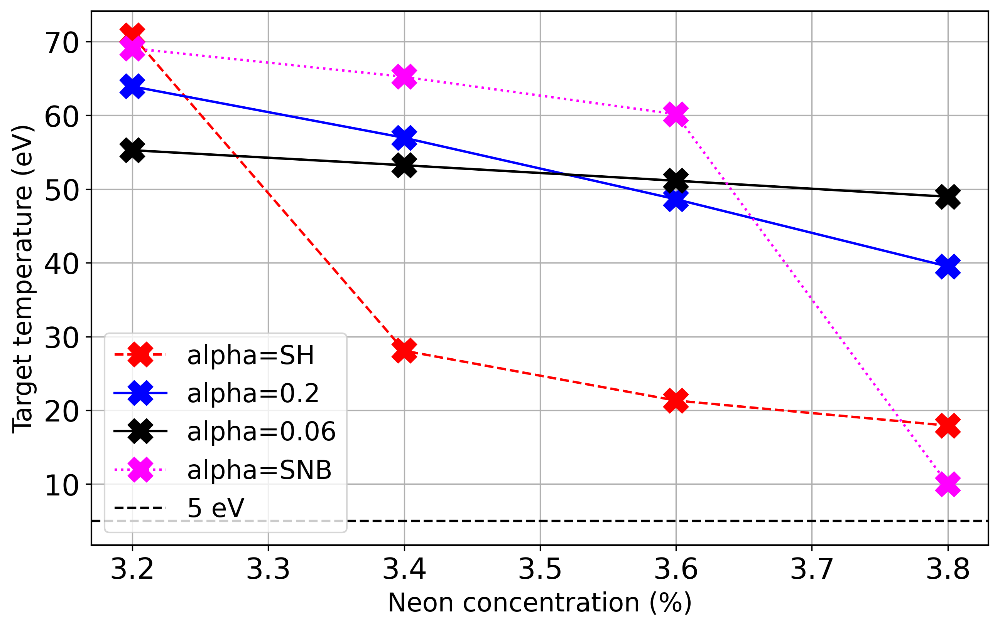

In [7]:
fig,ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)
# ax2 = ax.twinx()

neon_vals = np.array(neon_vals)

for i in alpha_vals:
    target_temp_list = []
    neon_radiation_list = []
    if i == -1:
        linestyle = '--'
        color = 'red'
        label = 'SH'
    elif i == 0.2:
        linestyle = '-'
        color = 'blue'
        label = i
    elif i == 0.06:
        linestyle = '-'
        color = 'black'
        label = i
    elif i == 'snb':
        linestyle = ':'
        color = 'magenta'
        label = 'SNB'

    for j in neon_vals:
        target_temp = replace_guards(cs[f'alpha_{i}_neon_{j}'].ds.isel(t=-1)['Te'].values)[-1]
        target_temp_list.append(target_temp)
        neon_radiation = -1 * sum(replace_guards(cs[f'alpha_{i}_neon_{j}'].ds.isel(t=-1)['Rneon'].values) * replace_guards(cs[f'alpha_{i}_neon_{j}'].ds.isel(t=-1)['dv'].values))
        neon_radiation_list.append(neon_radiation)

    ax.plot(np.array(neon_vals)*100, target_temp_list, linestyle=linestyle, color=color, label=f'alpha={label}', markersize=markersize, marker = 'X')
    # ax2.plot(np.array(neon_vals)*100, neon_radiation_list, linestyle=linestyle, color=color, markersize=markersize, marker = 'o')

    
ax.axhline(5, color='black', linestyle='--', label='5 eV')
ax.set_xlabel('Neon concentration (%)')
ax.set_ylabel('Target temperature (eV)')
ax.legend()



No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


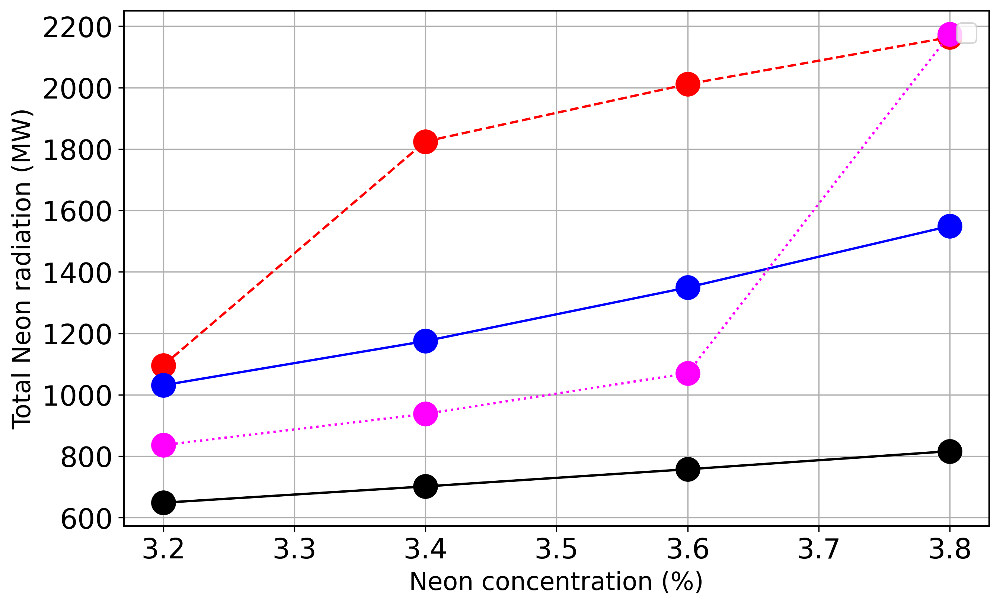

In [8]:
fig,ax = plt.subplots(1, 1, figsize=(10, 6), dpi=300)
# ax2 = ax.twinx()


# neon_vals = np.array([0.0, 0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1])

for i in alpha_vals:
    target_temp_list = []
    neon_radiation_list = []
    if i == -1:
        linestyle = '--'
        color = 'red'
    elif i == 0.2:
        linestyle = '-'
        color = 'blue'
    elif i == 0.06:
        linestyle = '-'
        color = 'black'
    elif i == 'snb':
        linestyle = ':'
        color = 'magenta'

    for j in neon_vals:
        target_temp = replace_guards(cs[f'alpha_{i}_neon_{j}'].ds.isel(t=-1)['Te'].values)[-1]
        target_temp_list.append(target_temp)
        neon_radiation = -1e-6 * sum(replace_guards(cs[f'alpha_{i}_neon_{j}'].ds.isel(t=-1)['Rneon'].values) * replace_guards(cs[f'alpha_{i}_neon_{j}'].ds.isel(t=-1)['dv'].values))
        neon_radiation_list.append(neon_radiation)

    # ax.plot(np.array(neon_vals)*100, target_temp_list, linestyle=linestyle, color=color, label=f'alpha={i}', markersize=markersize, marker = 'x')
    ax.plot(np.array(neon_vals)*100, neon_radiation_list, linestyle=linestyle, color=color, markersize=markersize, marker = 'o')

    
# ax.axhline(5, color='black', linestyle='--', label='Target temperature = 5 eV')
ax.set_xlabel('Neon concentration (%)')
ax.set_ylabel('Total Neon radiation (MW)')
ax.legend()

2 2
x = 802
div_q_snb =  802


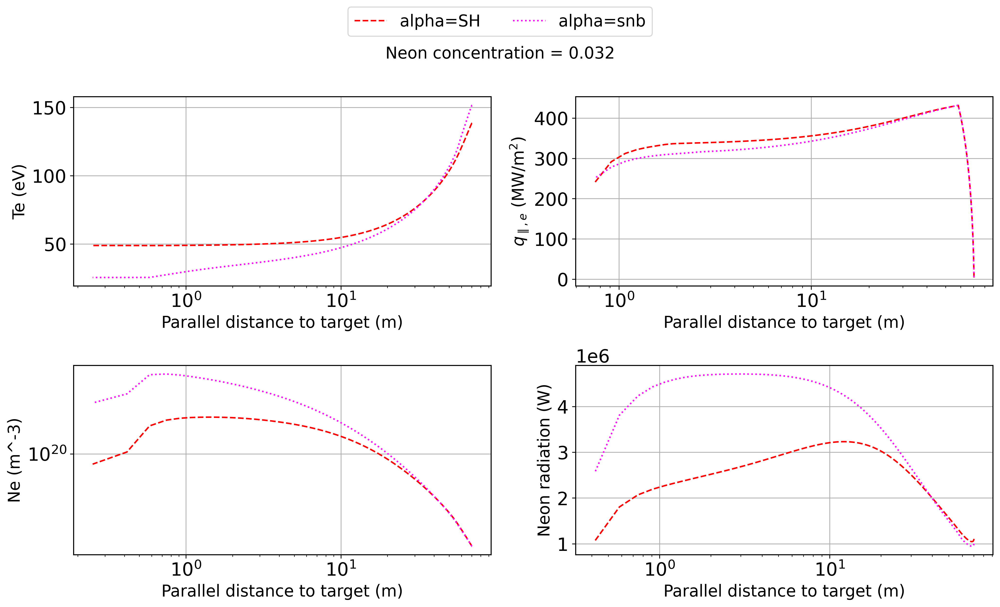

In [10]:
params = ['Te',  'q_cond', 'Ne', 'Rneon']
neon_value = '0.032'
# params = ['Te']

ncols = max(round(len(params)/2), 1)
nrows = ncols

print(ncols, nrows)

fig, ax = plt.subplots(nrows, ncols, figsize=(14, 8), dpi=300)

if isinstance(ax, np.ndarray):  # When multiple subplots
    ax = ax.flatten()  # Flatten the 2D array of axes to 1D
else:  # When there is only one subplot
    ax = np.array([ax])  # Make it a 1D array for consistency

y = cs['alpha_-1_neon_0.0'].ds['y'].values[1:-1]
for i in alpha_vals:
    label = i
    if i == -1:
        linestyle = '--'
        color = 'red'
        label = 'SH'
    elif i == 0.2:
        linestyle = '-'
        color = 'blue'
    elif i == 0.06:
        linestyle = '-'
        color = 'black'
    elif i == 'snb':
        linestyle = ':'
        color = 'magenta'

    for j, value in enumerate(params):

        if value == 'q_cond':
            if i == 'snb':
                profile = divq_integrate(cs[f'alpha_{i}_neon_{neon_value}'].ds.isel(t=-1), snb_int=True)
            else:
                profile = replace_guards(spitzer_q(cs[f'alpha_{i}_neon_{neon_value}'].ds.isel(t=-1)))

            ax[j].plot(y[::-1][3:-3], profile[3:-3] * 1e-6, linestyle=linestyle, color=color, label=f'alpha={label}')
            if np.max(profile) > 1e3:
                # ax[j].set_yscale('log')
                ax[j].set_ylabel(r'$q_{\parallel, e}$ (MW/m$^2$)')
                ax[j].set_xlabel('$S_{\parallel}$ (m)')

        elif value == 'Rneon':
            profile = -1 * replace_guards(cs[f'alpha_{i}_neon_{neon_value}'].ds.isel(t=-1)[value].values) * replace_guards(cs[f'alpha_{i}_neon_{neon_value}'].ds.isel(t=-1)['dv'].values)
            ax[j].plot(y[::-1][1:-1], profile[1:-1], linestyle=linestyle, color=color, label=f'alpha={label}')
            # if np.max(profile) > 1e3:
            #     # ax[j].set_yscale('symlog')
            ax[j].set_xlabel('$S_{\parallel}$ (m)')
            units = cs[f'alpha_{i}_neon_0.0'].ds.isel(t=-1)[value].units
            ax[j].set_ylabel(f'Neon radiation (W)')

        # elif value == 'Vd+':
        #     profile = replace_guards(cs[f'alpha_{i}_neon_{neon_value}'].ds.isel(t=-1)[value].values) * replace_guards(cs[f'alpha_{i}_neon_{neon_value}'].ds.isel(t=-1)['Nd+'].values)
        #     ax[j].plot(y[::-1], profile, linestyle=linestyle, color=color, label=f'alpha={label}')
        #     # if np.max(profile) > 1e3:
        #         # ax[j].set_yscale('symlog')
        #     ax[j].set_xlabel('$S_{\parallel}$ (m)')
        #     units = cs[f'alpha_{i}_neon_0.0'].ds.isel(t=-1)[value].units
        #     ax[j].set_ylabel(f'Ion flux to target ({units})')

        else:
            profile = replace_guards(cs[f'alpha_{i}_neon_{neon_value}'].ds.isel(t=-1)[value].values)
            ax[j].plot(y[::-1], profile, linestyle=linestyle, color=color, label=f'alpha={label}')
            if np.max(profile) > 1e3:
                ax[j].set_yscale('symlog')
            ax[j].set_xlabel('$S_{\parallel}$ (m)')
            units = cs[f'alpha_{i}_neon_0.0'].ds.isel(t=-1)[value].units
            ax[j].set_ylabel(f'{value} ({units})')
plt.tight_layout()

for axes in ax:
    axes.set_xscale('log')
    axes.set_xlabel('Parallel distance to target (m)')
    # axes.invert_xaxis()

# Only get legend handles/labels from the first axis (assumes same labels on all)
handles, labels = ax[0].get_legend_handles_labels()

# Create a single legend for the entire figure
fig.legend(handles, labels, loc='upper center', ncol=len(labels), bbox_to_anchor=(0.5, 1.06))
fig.subplots_adjust(top=0.85)  # Adjust top to make space for the legend
# Set the title for the entire figure
fig.suptitle(f'Neon concentration = {neon_value}', fontsize=16)

plt.tight_layout(rect=[0, 0, 1, 0.98])  # Make space for the legend

x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802
x = 802
div_q_snb =  802


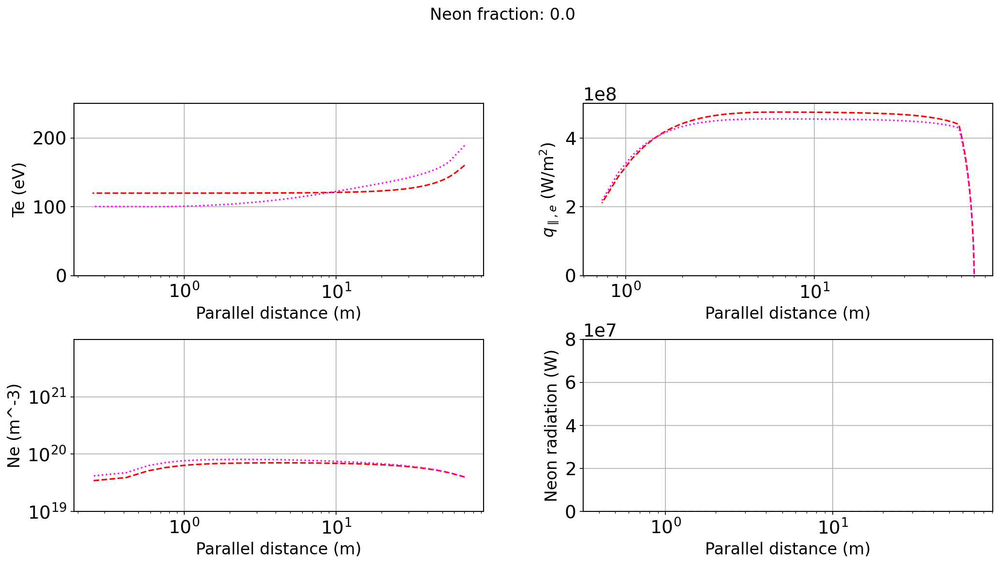

In [12]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
import numpy as np

# Your variables
params = ['Te', 'q_cond', 'Ne', 'Rneon']
# neon_vals = ['0.0','0.01','0.02','0.03','0.04','0.05','0.06', '0.07','0.08','0.09', '0.1']
alpha_vals = [-1, 'snb']

ncols = max(round(len(params)/2), 1)
nrows = ncols

fig, ax = plt.subplots(nrows, ncols, figsize=(14, 8), dpi=150)
if isinstance(ax, np.ndarray):
    ax = ax.flatten()
else:
    ax = np.array([ax])

y = cs['alpha_-1_neon_0.0'].ds['y'].values[1:-1]

# Styling
style_map = {
    -1: {'linestyle': '--', 'color': 'red', 'label': 'SH'},
    0.2: {'linestyle': '-', 'color': 'blue', 'label': '0.2'},
    0.06: {'linestyle': '-', 'color': 'black', 'label': '0.06'},
    'snb': {'linestyle': ':', 'color': 'magenta', 'label': 'SNB'}
}

def update(frame):
    neon_value = neon_vals[frame]
    
    # Clear all axes for redraw
    for axes in ax:
        axes.clear()

    for i in alpha_vals:
        style = style_map[i]
        label = style['label']
        linestyle = style['linestyle']
        color = style['color']

        for j, value in enumerate(params):
            ds = cs[f'alpha_{i}_neon_{neon_value}'].ds.isel(t=-1)

            if value == 'q_cond':
                if i == 'snb':
                    profile = divq_integrate(ds, snb_int=True)
                else:
                    profile = replace_guards(spitzer_q(ds))
                # profile = divq_integrate(ds, snb_int=True) if i == 'snb' else replace_guards(spitzer_q(ds))
                x = y[::-1][3:-3]
                y_vals = profile[3:-3]
            elif value == 'Rneon':
                y_vals = -1 * replace_guards(ds['Rneon'].values) * replace_guards(ds['dv'].values)
                x = y[::-1][1:-1]
                y_vals = y_vals[1:-1]
            else:
                y_vals = replace_guards(ds[value].values)
                x = y[::-1]

            ax[j].plot(x, y_vals, linestyle=linestyle, color=color, label=f'alpha={label}')
            
            # Axes settings
            if value == 'q_cond':
                ax[j].set_ylabel(r'$q_{\parallel, e}$ (W/m$^2$)')
            elif value == 'Rneon':
                ax[j].set_ylabel('Neon radiation (W)')
            else:
                units = cs[f'alpha_{i}_neon_0.0'].ds.isel(t=-1)[value].units
                ax[j].set_ylabel(f'{value} ({units})')
                if np.max(np.abs(y_vals)) > 1e3:
                    ax[j].set_yscale('symlog' if value != 'q_cond' else 'log')

            ax[j].set_xlabel('Parallel distance (m)')
            ax[j].set_xscale('log')
           

    # Title per frame
    handles, labels = ax[0].get_legend_handles_labels()
    # fig.legend(handles, labels, loc='upper center', ncol=len(labels), bbox_to_anchor=(0.5, 1.02))

    fig.suptitle(f"Neon fraction: {neon_value}", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.93])
    ax[0].set_ybound(0, 250)
    ax[1].set_ybound(0, 5e8)
    ax[2].set_ybound(1e19, 1e22)
    ax[3].set_ybound(0, 8e7)


    # Shared legend

# Animate
ani = FuncAnimation(fig, update, frames=len(neon_vals), repeat=False)

# Save as GIF
ani.save("high_res_multi_param_neon_sweep.gif", writer=PillowWriter(fps=1))


In [16]:
import imageio
from PIL import Image

# Read the GIF file
gif_reader = imageio.get_reader('/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/flux_limit/high_res_multi_param_neon_sweep.gif')

# Write the MP4 file
with imageio.get_writer('/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/flux_limit/high_res_multi_param_neon_sweep.mp4', fps=1) as writer:
    for frame in gif_reader:
        # Convert to RGB to ensure consistent number of channels
        img = Image.fromarray(frame).convert("RGB")
        writer.append_data(np.array(img))


IMAGEIO FFMPEG_WRITER WARNING: input image is not divisible by macro_block_size=16, resizing from (2100, 1200) to (2112, 1200) to ensure video compatibility with most codecs and players. To prevent resizing, make your input image divisible by the macro_block_size or set the macro_block_size to 1 (risking incompatibility).
[rawvideo @ 0x6736580] Stream #0: not enough frames to estimate rate; consider increasing probesize
[swscaler @ 0x6755ac0] Warning: data is not aligned! This can lead to a speed loss


# Convergence tests


In [ ]:

def plot_time_history(dataset, variables=['Te'], upstream_index=2, target_index=-2,
                      track_detachment_front=False, time_slices=800,
                      log_threshold=1e6, base_figsize=(6, 4), save=False, det_specification = 'Te'):
    """
    Plots the time history of user-specified variables at upstream and target positions
    on separate plots, using the last 200 time slices or the maximum available.

    Optionally tracks the detachment front, where Nd > Ne, and adds it as a separate subplot.

    Parameters:
    dataset (xarray Dataset): Hermes-3 dataset.
    variables (list): List of variables to plot (e.g., ['Te', 'Td+', 'Ne']).
    upstream_index (int): Index for the upstream data.
    target_index (int): Index for the target data.
    track_detachment_front (bool): If True, track the location where Nd > Ne
                                   and show it as a separate subplot.
    log_threshold (float): Threshold above which the y-axis will be plotted in log scale.
    base_figsize (tuple): Base figure size for a single plot (width, height).
    """
    # Determine how many time steps to plot (maximum 200 or the total available)
    num_time_slices = min(time_slices, dataset.sizes['t'])

    # Select the last `num_time_slices` time steps
    selected_steps = dataset.isel(t=slice(-num_time_slices, None))
    times = selected_steps['t'].values 
    t_conversion = dataset['t'].attrs.get('conversion', 1.0)
    # times = times * t_conversion  
    times = times * 1e3  # Convert to milliseconds for plotting

    # Find the last time step in milliseconds
    last_time_step = times[-1]

    # Adjust the number of subplots based on whether we're tracking detachment front
    total_vars = len(variables) + (1 if track_detachment_front else 0)

    # Dynamically scale figure size based on number of variables
    figsize = (base_figsize[0] * total_vars, base_figsize[1] * 2)

    # Create figure with subplots, one set for upstream and one for target, plus detachment front if enabled
    fig, axs = plt.subplots(2, total_vars, figsize=figsize, dpi=200)

    # Ensure axs is treated as a list if there's only one plot
    if total_vars == 1:
        axs = [axs[0], axs[1]]

    axs = np.ravel(axs)  # Flatten the axes for easy handling

    # Variable to store positions where Nd > Ne (detachment front)
    detachment_front_positions = [] if track_detachment_front else None

    if det_specification == 'Te':

    # If tracking the detachment front, calculate it for each time slice
        if track_detachment_front:
            front_positions = []
            for t_step in range(num_time_slices):
                ds_at_t = selected_steps.isel(t=t_step)
                front_loc = detachment_front_finder(ds_at_t, use_temperature=True)
                front_positions.append(front_loc)
            detachment_front_positions = np.array(front_positions)
    
    elif det_specification == 'Nd':
        if track_detachment_front:
            front_positions = []
            for t_step in range(num_time_slices):
                ds_at_t = selected_steps.isel(t=t_step)
                front_loc = detachment_front_finder(ds_at_t, use_temperature=False)
                front_positions.append(front_loc)
            detachment_front_positions = np.array(front_positions)

    else:
        print('Invalid det_specification. Please choose either "Te" or "Nd"')
        return

    # Iterate over each variable to plot upstream and target values
    for i, var in enumerate(variables):
        # Extract upstream and target data for each variable
        upstream_data = np.squeeze(selected_steps[var].isel(pos=upstream_index).values)
        target_data = np.squeeze(selected_steps[var].isel(pos=target_index).values)

        # Check if data exceeds the threshold, and use log scale if so
        if np.max(np.abs(upstream_data)) > log_threshold or np.max(np.abs(target_data)) > log_threshold:
            scale = "log"
        else:
            scale = "linear"

        # Plot upstream data on the top row
        axs[i].plot(times, upstream_data, label=f'Upstream {var}', marker='o', linestyle='-')
        axs[i].set_title(f'Upstream {var}')
        axs[i].set_xlabel('Time (ms)')
        axs[i].set_ylabel(f'{var} ({dataset[var].attrs.get("units", "Unknown units")})')
        axs[i].grid(True)
        axs[i].set_yscale(scale)

        # Apply custom log formatter for log scale
        if scale == "log":
            axs[i].yaxis.set_major_formatter(log_formatter())

        # Plot target data on the bottom row
        axs[i + total_vars].plot(times, target_data, label=f'Target {var}', marker='x', linestyle='--')
        axs[i + total_vars].set_title(f'Target {var}')
        axs[i + total_vars].set_xlabel('Time (ms)')
        axs[i + total_vars].set_ylabel(f'{var} ({dataset[var].attrs.get("units", "Unknown units")})')
        axs[i + total_vars].grid(True)
        axs[i + total_vars].set_yscale(scale)

        # Apply custom log formatter for target plot
        if scale == "log":
            axs[i + total_vars].yaxis.set_major_formatter(log_formatter())

    # Add a separate subplot for the detachment front position if requested
    if track_detachment_front:

        if det_specification == 'Te':
            label = 'Te <= 5 Front'
        elif det_specification == 'Nd':
            label = 'Nd > Ne Front'
        detachment_front_index = len(variables)  # The next index after all variables
        axs[detachment_front_index].plot(times, detachment_front_positions, marker='s', linestyle='-', color='red',
                                         label='label')
        axs[detachment_front_index].set_title(f'Detachment Front Position ({label})')
        axs[detachment_front_index].set_xlabel('Time (ms)')
        axs[detachment_front_index].set_ylabel('Position (m)')
        axs[detachment_front_index].grid(True)

        # Plot the same on the bottom row
        axs[detachment_front_index + total_vars].plot(times, detachment_front_positions, marker='s', linestyle='-', color='red',
                                                      label='label')
        axs[detachment_front_index + total_vars].set_title(f'Detachment Front Position ({label})')
        axs[detachment_front_index + total_vars].set_xlabel('Time (ms)')
        axs[detachment_front_index + total_vars].set_ylabel('Position (m)')
        axs[detachment_front_index + total_vars].grid(True)

    # Set the figure's overall title with the time of the last time step
    plt.suptitle(f"Time History of Variables (Last time step: {last_time_step:.8f} (ms) / {last_time_step*1e-3:.8f}(s)", fontsize=16)

    plt.tight_layout()
    print(f"final time step: {last_time_step} (ms) / {last_time_step*1e-3}(s)")

    if save:
        time_history_filename = "time_history_plot.png"
        print(f'Time history plot saved as {time_history_filename}')
        # plt.savefig(time_history_filename)
        # plt.close()

In [ ]:
for i in cs:
    ds = cs[i].ds
    print(ds)
    plot_time_history(ds, variables=['Te', 'Td+', 'Ne', 'Nd', 'Sd+_src', 'Pe_src'], track_detachment_front=True, save=False)

<xarray.Dataset>
Dimensions:                        (pos: 804, t: 61)
Coordinates:
    dx                             (pos) float64 dask.array<chunksize=(804,), meta=np.ndarray>
    dy                             (pos) float64 dask.array<chunksize=(804,), meta=np.ndarray>
    dz                             (pos) float64 dask.array<chunksize=(804,), meta=np.ndarray>
  * t                              (t) float64 0.03132 0.03137 ... 0.03445
    y                              (pos) float64 0.08327 0.2497 ... 70.34 70.35
  * pos                            (pos) float64 -0.2496 -0.08312 ... 70.0 70.01
Data variables: (12/89)
    Bxy                            (pos) float64 dask.array<chunksize=(804,), meta=np.ndarray>
    Ed+_iz                         (t, pos) float64 dask.array<chunksize=(61, 804), meta=np.ndarray>
    Ed+_rec                        (t, pos) float64 dask.array<chunksize=(61, 804), meta=np.ndarray>
    Ed+_sheath                     (t, pos) float64 dask.array<chunksize=(6

/tmp/ipykernel_3611995/401650539.py:105: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axs[i + total_vars].set_yscale(scale)


final time step: 34.45095968987899 (ms) / 0.03445095968987899(s)
Time history plot saved as time_history_plot.png
<xarray.Dataset>
Dimensions:                        (pos: 804, t: 61)
Coordinates:
    dx                             (pos) float64 dask.array<chunksize=(804,), meta=np.ndarray>
    dy                             (pos) float64 dask.array<chunksize=(804,), meta=np.ndarray>
    dz                             (pos) float64 dask.array<chunksize=(804,), meta=np.ndarray>
  * t                              (t) float64 0.03717 0.03722 ... 0.0403
    y                              (pos) float64 0.08327 0.2497 ... 70.34 70.35
  * pos                            (pos) float64 -0.2496 -0.08312 ... 70.0 70.01
Data variables: (12/89)
    Bxy                            (pos) float64 dask.array<chunksize=(804,), meta=np.ndarray>
    Ed+_iz                         (t, pos) float64 dask.array<chunksize=(61, 804), meta=np.ndarray>
    Ed+_rec                        (t, pos) float64 dask.array<

alpha_-1_neon_0.032


/users/jlb647/scratch/simulation_program/hermes-3_sim/analysis/my_notebooks/notebooks/hermes-3/general_functions/convergence_functions.py:234: UserWarning: Data has no positive values, and therefore cannot be log-scaled.
  axs[i + total_vars].set_yscale(scale)


final time step: 299.97390173605544 (ms) / 0.2999739017360554(s)
alpha_-1_neon_0.034
final time step: 299.97390173605544 (ms) / 0.2999739017360554(s)
alpha_-1_neon_0.036
final time step: 284.9752066492527 (ms) / 0.2849752066492527(s)
alpha_-1_neon_0.038
final time step: 299.97390173605544 (ms) / 0.2999739017360554(s)
alpha_0.2_neon_0.032
final time step: 32.9971291909661 (ms) / 0.0329971291909661(s)
alpha_0.2_neon_0.034
final time step: 55.995128324063685 (ms) / 0.055995128324063684(s)
alpha_0.2_neon_0.036
final time step: 299.97390173605544 (ms) / 0.2999739017360554(s)
alpha_0.2_neon_0.038
final time step: 299.97390173605544 (ms) / 0.2999739017360554(s)
alpha_0.06_neon_0.032
final time step: 299.97390173605544 (ms) / 0.2999739017360554(s)
alpha_0.06_neon_0.034
final time step: 299.97390173605544 (ms) / 0.2999739017360554(s)
alpha_0.06_neon_0.036
final time step: 299.97390173605544 (ms) / 0.2999739017360554(s)
alpha_0.06_neon_0.038
final time step: 299.97390173605544 (ms) / 0.299973901

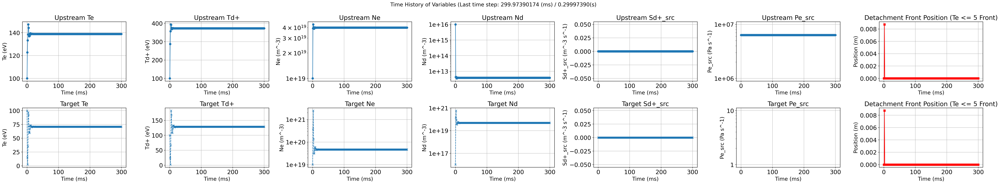

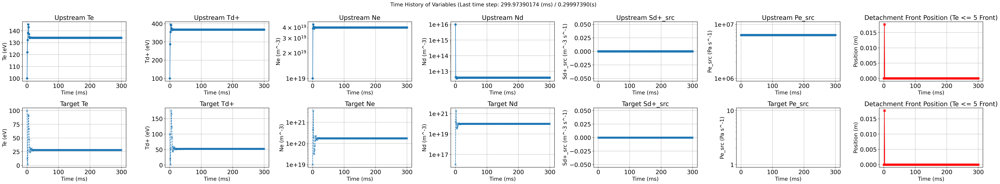

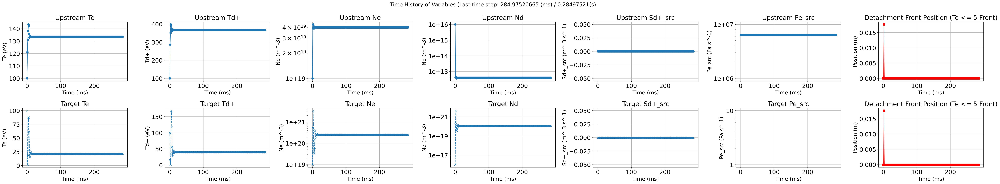

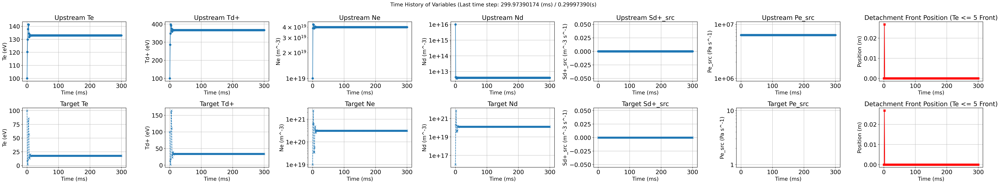

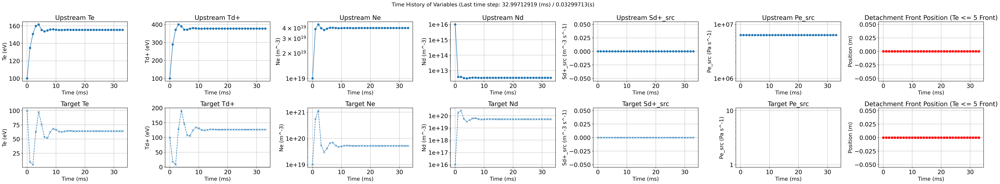

...

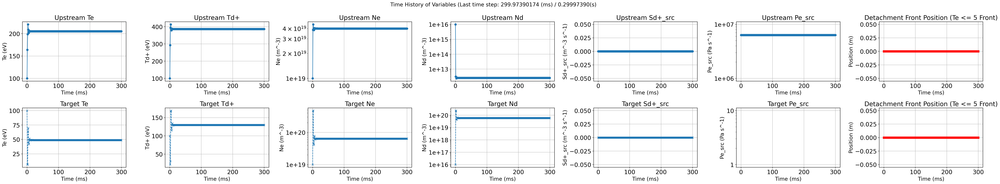

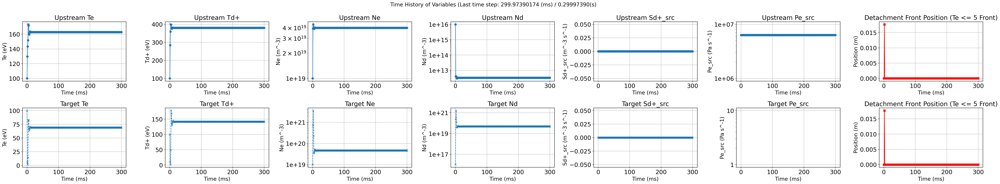

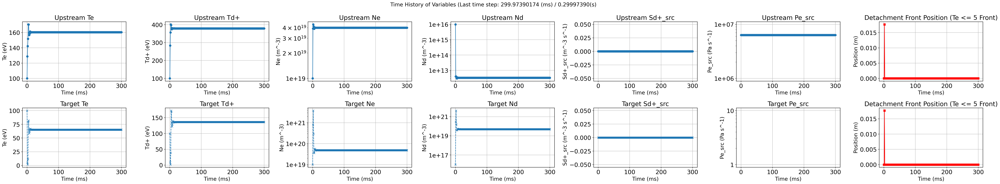

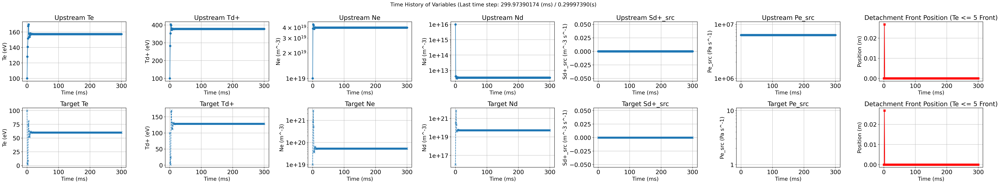

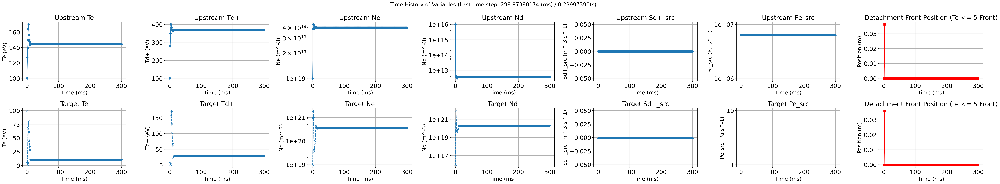

In [10]:
for i in cs:
    ds = cs[i].ds
    print(i)
    plot_time_history(ds, variables=['Te', 'Td+', 'Ne', 'Nd', 'Sd+_src', 'Pe_src'], track_detachment_front=True, save=False)